In [1]:
cd /orange/adamginsburg/w51/gtc/GTC2-20AFLO/OB0001/object

/orange/adamginsburg/w51/gtc/GTC2-20AFLO/OB0001/object


In [2]:
files = !ls *fits

In [3]:
len(files)

234

In [28]:
files[40]

'0002613683-20200712-EMIR-STARE_IMAGE.fits'

In [29]:
from astropy.io import fits

In [30]:
filehandle = fits.open(files[40])

In [31]:
filehandle

In [32]:
from astropy.wcs import WCS

In [33]:
filehandle[0].header

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                   16 / number of bits per data pixel                  
NAXIS   =                    2 / number of data axes                            
NAXIS1  =                 2048 / length of data axis 1                          
NAXIS2  =                 2048 / length of data axis 2                          
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
BZERO   =                32768 / offset data range to that of unsigned short    
BSCALE  =                    1 / default scaling factor                         
DETVER  = 'SCI     '           / 401 Detector used: science or engineering      
NSEC    =                    1 / 402 Number of sequences executed at detector   
NRST    =                   

In [34]:
filehandle[0].header['FILTER']

'J'

In [35]:
ww = WCS(filehandle[0].header)

In [36]:
%matplotlib inline
import pylab as pl
from astropy import visualization
pl.style.use('dark_background')

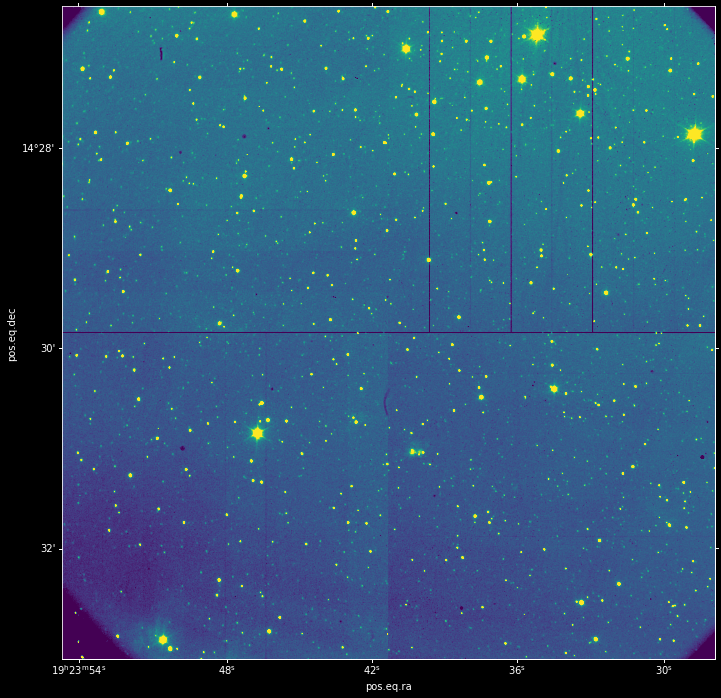

In [37]:
# https://docs.astropy.org/en/stable/visualization/wcsaxes/
pl.figure(figsize=(12,12))
pl.subplot(projection=ww) # this line makes the image show up with RA/Dec coordinates
pl.imshow(filehandle[0].data,
          norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.5))

In [38]:
from astroquery.vizier import Vizier
from astropy import coordinates, units as u

In [39]:
# cx, cy are 1024
cy, cx = (x/2 for x in filehandle[0].data.shape)
cx, cy

(1024.0, 1024.0)

In [40]:
ra, dec = ww.wcs_pix2world(cx, cy, 0)*u.deg
ra, dec

(<Quantity 290.9221038 deg>, <Quantity 14.49740818 deg>)

In [41]:
center = coordinates.SkyCoord(ra, dec, frame='fk5')
center

<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (290.9221038, 14.49740818)>

In [42]:
tables = Vizier(row_limit=10000).query_region(center, radius=5*u.arcmin, catalog='2MASS')
tables

TableList with 2 tables:
	'0:II/246/out' with 15 column(s) and 1720 row(s) 
	'1:VII/233/xsc' with 13 column(s) and 12 row(s) 

In [43]:
table = tables[0]

In [44]:
table.meta

{'ID': 'II_246_out',
 'name': 'II/246/out',
 'description': '2MASS Point Source Catalogue, output (on a total of 470,992,970 sources)'}

In [45]:
table

RAJ2000,DEJ2000,_2MASS,Jmag,e_Jmag,Hmag,e_Hmag,Kmag,e_Kmag,Qflg,Rflg,Bflg,Cflg,Xflg,Aflg
deg,deg,,mag,mag,mag,mag,mag,mag,,,,,,
float64,float64,bytes17,float32,float32,float32,float32,float32,float32,bytes3,bytes3,bytes3,bytes3,uint8,uint8
290.865386,14.437401,19232769+1426146,14.864,0.050,14.083,0.066,13.798,0.063,AAA,222,111,000,0,0
290.872864,14.436471,19232948+1426112,17.823,--,14.175,0.055,10.756,0.022,UAA,022,011,000,0,0
290.873401,14.431552,19232961+1425535,16.439,--,15.643,--,14.172,0.085,UUA,002,001,000,0,0
290.874978,14.435305,19232999+1426070,14.476,0.036,13.782,0.041,13.563,0.048,AAA,222,111,00c,0,0
290.872652,14.434007,19232943+1426024,14.130,0.032,13.527,0.039,13.291,0.047,AAA,222,111,000,0,0
290.867867,14.436468,19232828+1426112,16.111,0.112,14.062,0.066,12.966,0.051,BAA,222,111,000,0,0
290.868389,14.434249,19232841+1426032,16.438,0.134,15.363,0.138,14.252,--,BBU,220,110,000,0,0
290.869987,14.432382,19232879+1425565,14.996,0.059,14.128,0.063,13.314,--,AAU,226,120,0c0,0,0


In [46]:
table_coordinates = coordinates.SkyCoord(table['RAJ2000'], table['DEJ2000'], frame='fk5')

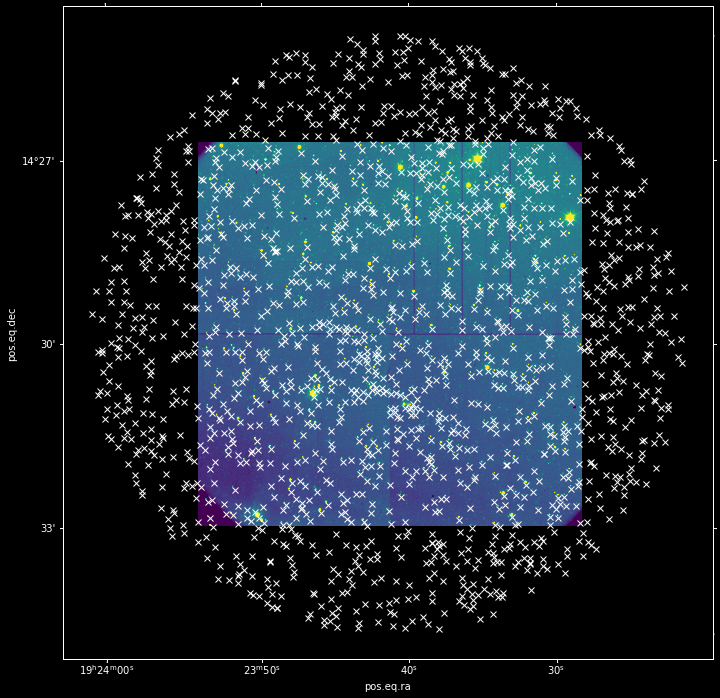

In [47]:
pl.figure(figsize=(12,12))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.5))
pl.plot(table_coordinates.ra, table_coordinates.dec, transform=ax.get_transform('world'), marker='x', color='w', linestyle='none')

(-0.5, 2047.5, -0.5, 2047.5)

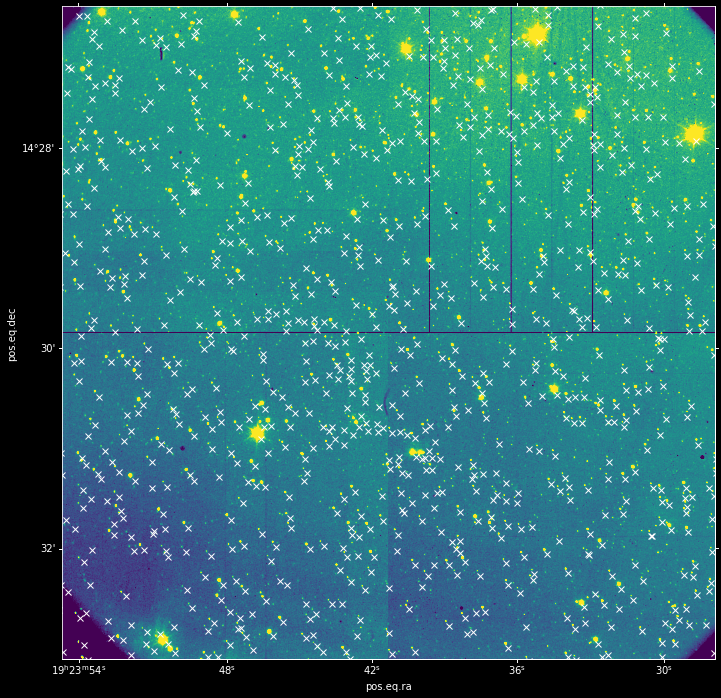

In [48]:
pl.figure(figsize=(12,12))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99))
axlims = ax.axis()
pl.plot(table_coordinates.ra, table_coordinates.dec, transform=ax.get_transform('world'), marker='x', color='w', linestyle='none')
ax.axis(axlims)

In [49]:
brightstars = table['Jmag'] < 12
brightstars.sum()

40

(-0.5, 2047.5, -0.5, 2047.5)

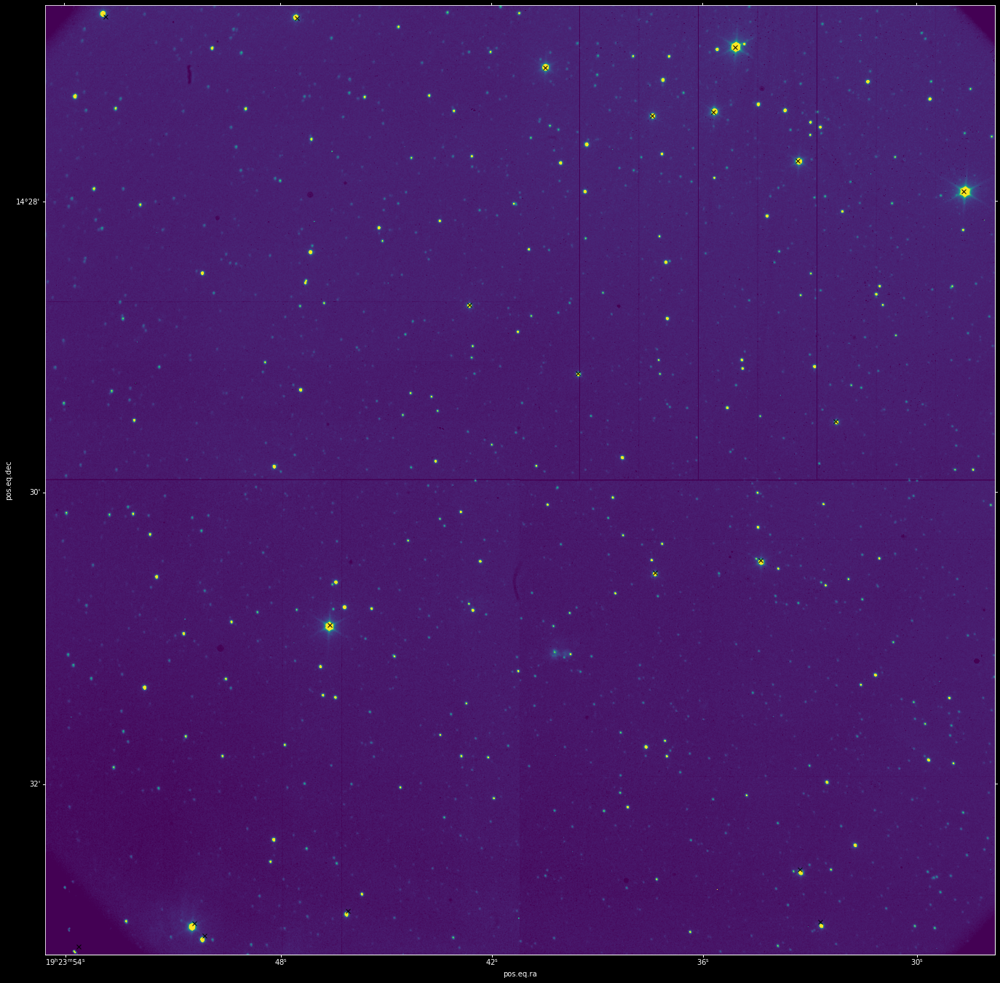

In [50]:
# because the offset was so bad, I decided to try to fix the WCS a little before doing cross-matching
# the code below re-loads the WCS, then shifts it up by 4" and left by 1.8"
ww = WCS(filehandle[0].header)
ww.wcs.crval[1] += 4/3600
ww.wcs.crval[0] -= 1.8/3600


pl.figure(figsize=(24,24))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.9))
axlims = ax.axis()
pl.plot(table_coordinates.ra[brightstars],
        table_coordinates.dec[brightstars],
        transform=ax.get_transform('world'), marker='x', color='k', linestyle='none')
ax.axis(axlims)

In [51]:
from photutils import DAOStarFinder
std = filehandle[0].data.std() # crummy guess!!
daofind = DAOStarFinder(fwhm=3.0, threshold=4.*std)

In [52]:
import numpy as np
starcat = daofind(filehandle[0].data - np.median(filehandle[0].data)) 

In [53]:
starcat

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64
1,64.18797116149294,4.308968226295303,0.5275476391206498,-0.08132868444387878,0.0747277897355327,25,0.0,12652.0,2.681232572711032,-1.0708362168522736
2,61.89605139784431,6.767966658309084,0.49686915232823425,-0.17831535114358602,-0.14630282754705703,25,0.0,11865.0,2.5994727158217503,-1.0372131585495556
3,1579.630028245332,18.473996174280366,0.544808335224971,-0.5408303070909098,0.3970357904514026,25,0.0,7303.0,1.2499256186466605,-0.24221042377522395
4,339.14057063462025,29.41536624568236,0.48611727221318884,0.06346946416401494,0.738602477991912,25,0.0,39356.0,5.482415972693714,-1.8474299602559792
5,338.2529430759503,32.50634007683815,0.44981844829749446,0.5442115757046682,0.3197471438988493,25,0.0,41965.0,4.653885433351409,-1.6695392196824739
6,338.9916986671723,32.31902476589674,0.35216390670671427,-0.41218135243327886,0.3658779424729705,25,0.0,42351.0,5.504651701720018,-1.8518246121720376
7,879.5249479824636,36.42758021637378,0.5457165039760457,-0.4391249894152243,0.18092194528376773,25,0.0,6702.0,1.1420364489035504,-0.14419991236887014
8,1390.6237324595736,48.46152595053497,0.39496479404248436,-0.5391393159203975,0.29240949173292863,25,0.0,11498.0,2.2492902959270817,-0.8801137739640025
9,1917.9042127969965,56.867687727996866,0.39961938816215176,-0.39748716860198885,0.364979608339734,25,0.0,6301.0,1.2363426651022942,-0.2303471415624163


(-0.5, 2047.5, -0.5, 2047.5)

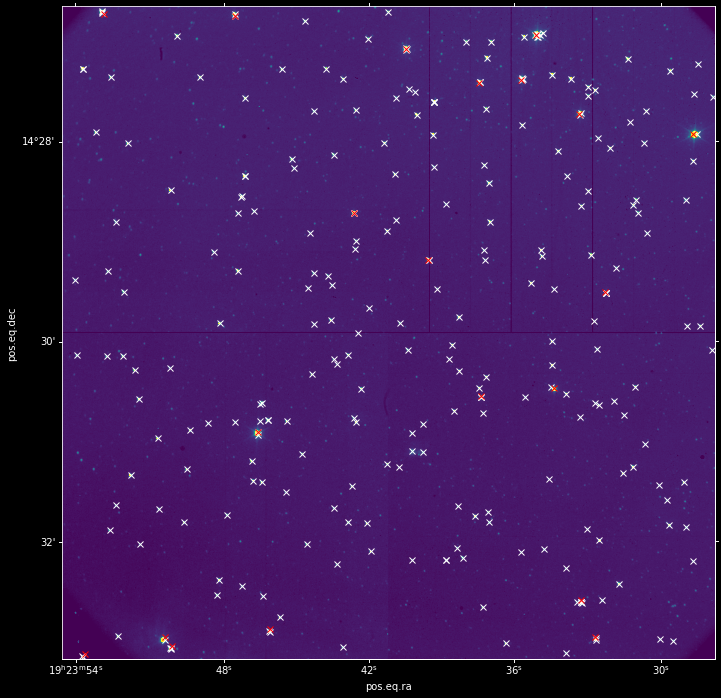

In [54]:
pl.figure(figsize=(12,12))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.9))
pl.plot(starcat['xcentroid'], starcat['ycentroid'], 'wx')
pl.plot(table_coordinates.ra[brightstars],
        table_coordinates.dec[brightstars],
        transform=ax.get_transform('world'), marker='x', color='r', linestyle='none')
ax.axis(axlims)

In [55]:
xc, yc = ww.all_world2pix(table_coordinates.ra, table_coordinates.dec, 0)

In [56]:
ra, dec = ww.all_pix2world(starcat['xcentroid'], starcat['ycentroid'], 0)*u.deg

In [57]:
starfind_coords = coordinates.SkyCoord(ra, dec, frame='fk5')

In [58]:
starfind_coords.shape, table_coordinates.shape

((268,), (1720,))

In [59]:
match_index, match_distance, _ = coordinates.match_coordinates_sky(starfind_coords, table_coordinates)

(array([207.,  51.,   6.,   0.,   1.,   0.,   0.,   1.,   1.,   1.]),
 array([ 0.03478272,  1.0375331 ,  2.04028348,  3.04303385,  4.04578423,
         5.04853461,  6.05128499,  7.05403537,  8.05678575,  9.05953612,
        10.0622865 ]),
 <BarContainer object of 10 artists>)

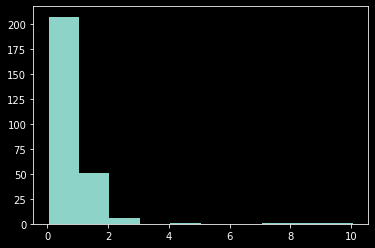

In [60]:
pl.hist(match_distance.to(u.arcsec).value)

In [61]:
new_sky_coordinates = table_coordinates[match_index]
new_sky_coordinates_xy = ww.all_world2pix(new_sky_coordinates.ra, new_sky_coordinates.dec, 0)

(-0.5, 2047.5, -0.5, 2047.5)

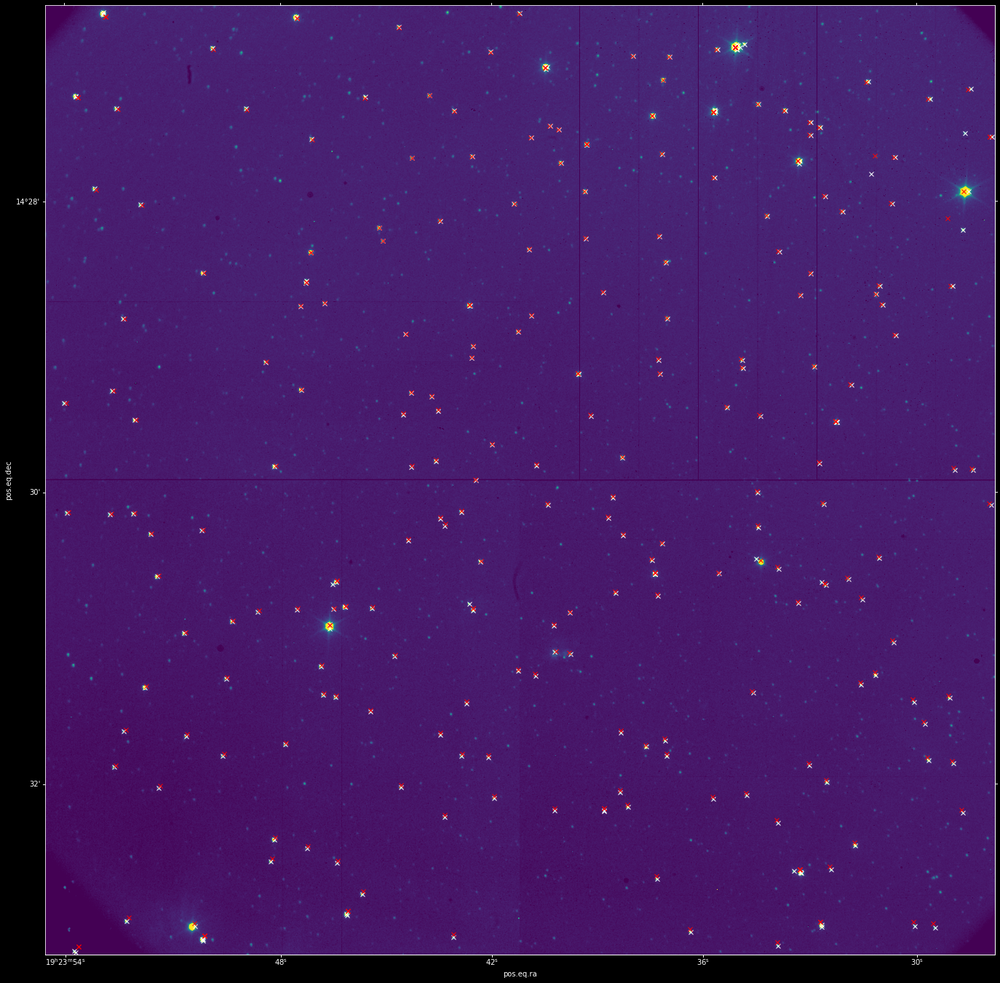

In [62]:
pl.figure(figsize=(24,24))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.9))
pl.plot(starcat['xcentroid'], starcat['ycentroid'], 'wx')
pl.plot(new_sky_coordinates_xy[0], new_sky_coordinates_xy[1], 'rx')
ax.axis(axlims)

In [63]:
from astropy.wcs.utils import fit_wcs_from_points

In [64]:
xy_starfind = np.array([starcat['xcentroid'], starcat['ycentroid']])

In [65]:
new_wcs = fit_wcs_from_points(xy_starfind, new_sky_coordinates, sip_degree=2)

In [66]:
new_wcs

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP'  'DEC--TAN-SIP'  
CRVAL : 290.9207852244152  14.49824187716336  
CRPIX : 1040.649494783121  1028.233865743906  
CD1_1 CD1_2  : -5.325086760397444e-05  -1.7500503159758827e-08  
CD2_1 CD2_2  : -4.801638231645882e-08  -5.321896833379253e-05  
NAXIS : 2000.599808321845  2028.1511998960414

In [67]:
new_ra, new_dec = new_wcs.wcs_pix2world(starcat['xcentroid'], starcat['ycentroid'], 0)*u.deg

In [68]:
visualization.quantity_support()

<astropy.visualization.units.quantity_support.<locals>.MplQuantityConverter at 0x2b00ad3a9898>

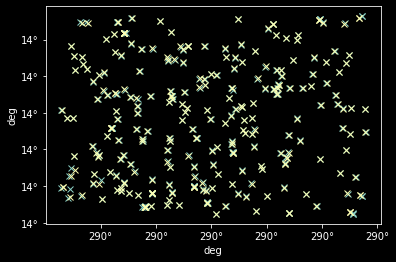

In [69]:
pl.plot(new_ra, new_dec, 'x')
pl.plot(new_sky_coordinates.ra, new_sky_coordinates.dec, 'x')

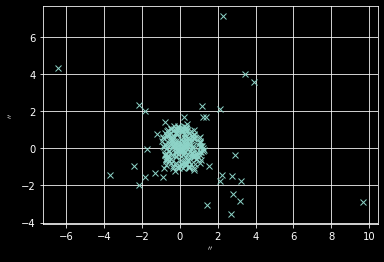

In [70]:
ra_residual = (new_ra-new_sky_coordinates.ra).to(u.arcsec)
dec_residual = (new_dec-new_sky_coordinates.dec).to(u.arcsec)
pl.plot(ra_residual, dec_residual, 'x')
pl.grid()

In [71]:
bad_matches = (ra_residual < -2*u.arcsec) | (ra_residual > 2*u.arcsec) | (dec_residual > 2*u.arcsec) | (dec_residual < -2*u.arcsec)
bad_matches.sum(), len(bad_matches)

(21, 268)

In [72]:
xy_starfind2 = xy_starfind.T[~bad_matches].T
new_sky_coordinates2 = new_sky_coordinates.T[~bad_matches].T
new_wcs2 = fit_wcs_from_points(xy_starfind2, new_sky_coordinates2, sip_degree=3)

In [73]:
new_ra2, new_dec2 = new_wcs2.wcs_pix2world(starcat['xcentroid'], starcat['ycentroid'], 0)*u.deg

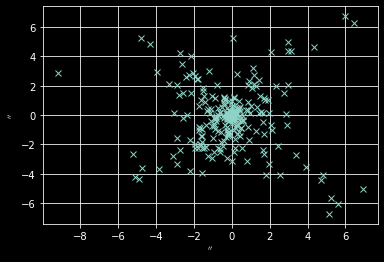

In [74]:
ra_residual2 = (new_ra2-new_sky_coordinates.ra).to(u.arcsec)
dec_residual2 = (new_dec2-new_sky_coordinates.dec).to(u.arcsec)
pl.plot(ra_residual2, dec_residual2, 'x')
pl.grid()

In [75]:
new_wcs2

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP'  'DEC--TAN-SIP'  
CRVAL : 290.9207852241665  14.498240877162957  
CRPIX : 1039.9487973608295  1027.7058202186863  
CD1_1 CD1_2  : -5.400099533949063e-05  -8.148368070955867e-09  
CD2_1 CD2_2  : 1.5693963881478978e-09  -5.40277840583881e-05  
NAXIS : 2000.599808321845  2011.9827855212193

(-0.5, 2047.5, -0.5, 2047.5)

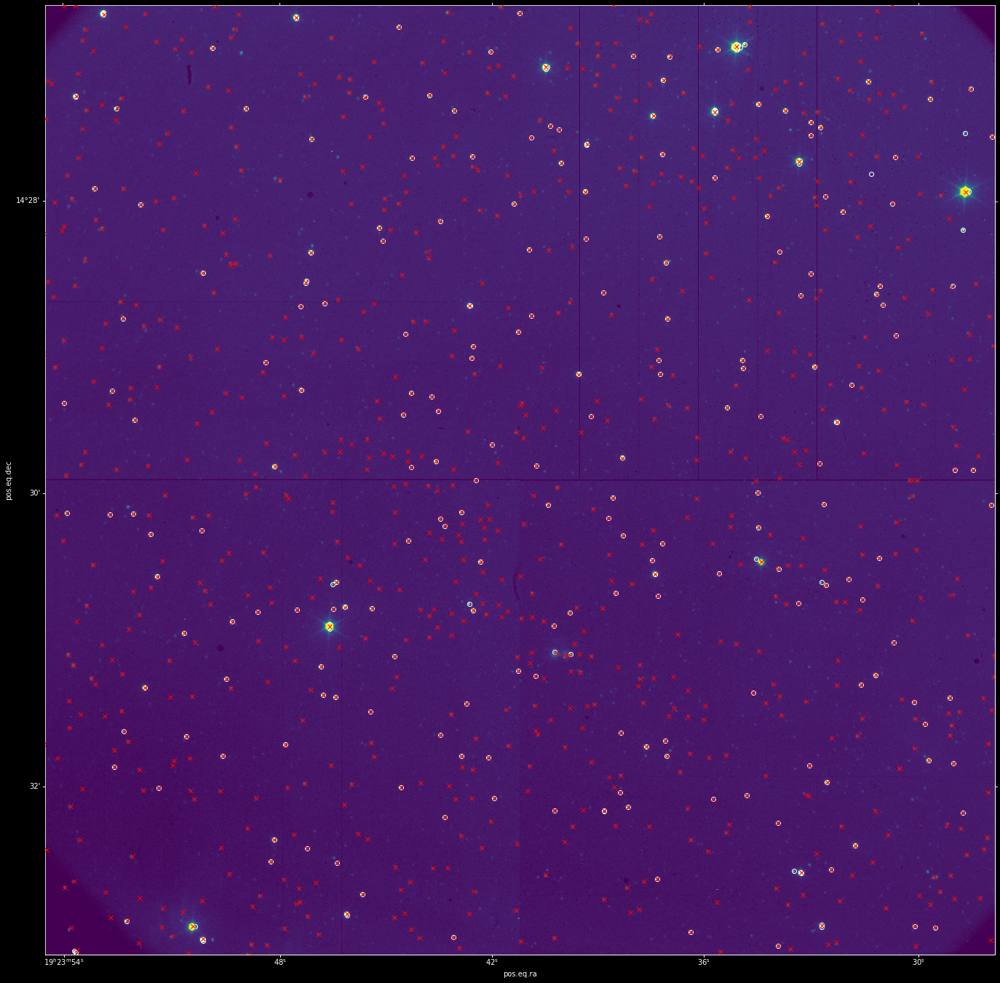

In [76]:
pl.figure(figsize=(24,24))
ax = pl.subplot(projection=new_wcs2)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.9))
pl.plot(starcat['xcentroid'], starcat['ycentroid'], 'wo', markeredgecolor='w', markerfacecolor='none')
pl.plot(table_coordinates.ra,
        table_coordinates.dec,
        transform=ax.get_transform('world'), marker='x', color='r', linestyle='none')
ax.axis(axlims)

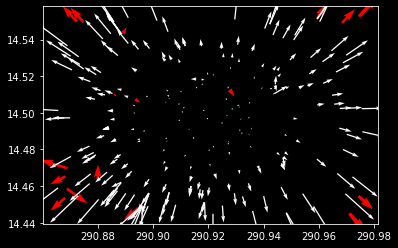

In [77]:
#per star shifts
#pl.quiver(new_ra.value, new_dec.value, ra_residual2.value, dec_residual2.value, color='w')
pl.quiver(new_ra.value[bad_matches], new_dec.value[bad_matches], ra_residual2.value[bad_matches], dec_residual2.value[bad_matches], color='r')
pl.quiver(new_ra.value[~bad_matches], new_dec.value[~bad_matches], ra_residual2.value[~bad_matches], dec_residual2.value[~bad_matches], color='w')

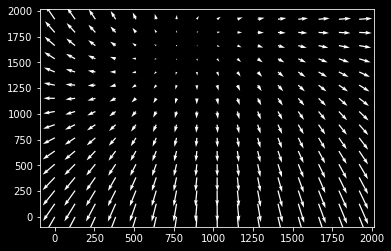

In [78]:
#distortion model in pixel coords
ygrid, xgrid = np.mgrid[0:2048:128, 0:2048:128]
r1,d1 = ww.all_pix2world(xgrid, ygrid, 0)
r2,d2 = new_wcs2.all_pix2world(xgrid, ygrid, 0)
pl.quiver(xgrid, ygrid, r2-r1, d2-d1, color='w')

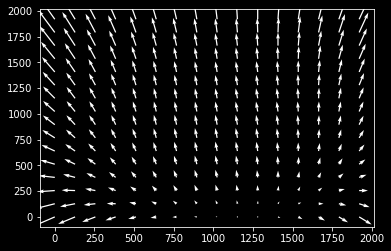

In [65]:
ygrid, xgrid = np.mgrid[0:2048:128, 0:2048:128]
# this doesn't do anything because the original "ww" didn't have SIP coefficients (x1 == xgrid exactly)
x1,y1 = ww.sip_pix2foc(xgrid, ygrid, 0)
# `sip_pix2foc` returns locations relative to crpix, so we redefine x1,x2 to be relative to crpix
x1,y1 = xgrid - ww.wcs.crpix[0], ygrid - ww.wcs.crpix[1]
x2,y2 = new_wcs2.sip_pix2foc(xgrid, ygrid, 0)
pl.quiver(xgrid, ygrid, x1-x2, y1-y2, color='w')